### Question 1 - [70 marks]
#### Dataset sourced from Kaggle Competitions
URL - https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package

### About DataSet
#### Context
Predict next-day rain by training classification models on the target variable RainTomorrow.

#### Content
This dataset contains about 10 years of daily weather observations from many locations across Australia.

RainTomorrow is the target variable to predict. It means -- did it rain the next day, Yes or No? This column is Yes if the rain for that day was 1mm or more.

#### Source & Acknowledgements
Observations were drawn from numerous weather stations. The daily observations are available from http://www.bom.gov.au/climate/data.
An example of latest weather observations in Canberra: http://www.bom.gov.au/climate/dwo/IDCJDW2801.latest.shtml

Definitions adapted from http://www.bom.gov.au/climate/dwo/IDCJDW0000.shtml
Data source: http://www.bom.gov.au/climate/dwo/ and http://www.bom.gov.au/climate/data.

Copyright Commonwealth of Australia 2010, Bureau of Meteorology.



### Importing Dataset from Kaggle

In [2]:
#Importing Dataset

%pip install opendatasets --upgrade --quiet

Note: you may need to restart the kernel to use updated packages.


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [4]:
import opendatasets as od

url = 'https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package'
od.download(url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:Your Kaggle Key:Downloading weather-dataset-rattle-package.zip to .\weather-dataset-rattle-package


100%|██████████| 3.83M/3.83M [00:00<00:00, 4.22MB/s]


In [6]:
import os
data = './weather-dataset-rattle-package'
os.listdir(data)

['weatherAUS.csv']

In [7]:
train_csv = data + './weatherAUS.csv'

### Importing required Libraries

In [34]:
#Import Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px

In [10]:
df = pd.read_csv(train_csv)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


The dataset contains over 145,000 rows and 23 columns. The dataset contains date, numeric and categorical columns. ```RainTomorrow``` is our target variable for rain prediction.

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [13]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [14]:
df.dropna(subset=['RainToday','RainTomorrow'], inplace=True)

### EDA

<AxesSubplot:title={'center':'Number of rows per year'}, xlabel='Date', ylabel='count'>

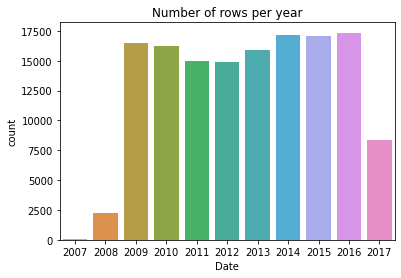

In [26]:
plt.title('Number of rows per year')
sns.countplot(x=pd.to_datetime(df.Date).dt.year)

In [17]:
df.Location.nunique()

49

In [16]:
px.histogram(df, x='Location', title="Rainfall based on Location", color='RainToday')

In [18]:
px.histogram(df, x='Temp3pm', title="Temperature(3pm) vs RainTomorrow", color='RainTomorrow')

Based on the above visualization above it is more likely to rain if the temperature is between 18-26 degree celcius.

In [19]:
px.histogram(df, x='RainTomorrow', title="RainTomorrow based on RainToday", color='RainToday')

From the above visualization it depicts a class imbalance in the amount of rain held. At the same time if there was no rain today then there are higher chances of not having rain tomorrow.

In [21]:
px.scatter(df.sample(5000), title='Temperature Trend (MaxTemp vs MinTemp',
                        x='MinTemp',
                        y='MaxTemp',
                        color='RainToday')

There is a linear correlation between the MaxTemp and the MinTemp. The variation in the temperature is small when it rains on a particular day.

In [23]:
px.histogram(df, x='Humidity3pm', y = 'Temp3pm', title="Temperature vs Humidity", color='RainTomorrow')

In [25]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

### Train Test Split and Model

In [57]:
#TestTrainSplit
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

#ML Models
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
#Tree
from sklearn.tree import DecisionTreeClassifier
# Ensembling Techniques
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import StackingClassifier, BaggingClassifier, AdaBoostClassifier 

#Scores & Metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score,recall_score,classification_report,confusion_matrix

In [35]:
df.shape

(140787, 23)

In [39]:
n_cols = X.select_dtypes(include=np.number).columns.to_list()
c_cols = X.select_dtypes('object').columns.to_list()

In [44]:
n_cols, c_cols

(['MinTemp',
  'MaxTemp',
  'Rainfall',
  'Evaporation',
  'Sunshine',
  'WindGustSpeed',
  'WindSpeed9am',
  'WindSpeed3pm',
  'Humidity9am',
  'Humidity3pm',
  'Pressure9am',
  'Pressure3pm',
  'Cloud9am',
  'Cloud3pm',
  'Temp9am',
  'Temp3pm'],
 ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday'])

### Imputing Nulls with mean using SimpleImputer

In [45]:
#Simple Imputer - Imputes the missing values in the dataset with mean

from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')

In [46]:
#Missing Values in each column
df[n_cols].isna().sum()

MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustSpeed     9105
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
dtype: int64

In [50]:
imputer.fit(df[n_cols])
df[n_cols]=imputer.transform(df[n_cols])

In [51]:
#Missing Values in each column
df[n_cols].isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

### MinMax Scaling

In [58]:
scaler = MinMaxScaler()
scaler.fit(df[n_cols])
df[n_cols]=scaler.transform(df[n_cols])

In [59]:
df[n_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000
mean,0.487850,0.529964,0.006334,0.037741,0.526244,0.263337,0.107619,0.214151,0.688268,0.514493,0.614125,0.610527,0.492351,0.499917,0.510276,0.520023
std,0.150784,0.134343,0.022817,0.021926,0.189061,0.101797,0.068099,0.100214,0.189607,0.205470,0.111557,0.106920,0.253806,0.234384,0.136727,0.131916
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.379717,0.429112,0.000000,0.027586,0.526244,0.193798,0.053846,0.149425,0.570000,0.370000,0.545455,0.542400,0.333333,0.444444,0.411392,0.424184
50%,0.483491,0.519849,0.000000,0.037741,0.526244,0.255814,0.100000,0.214151,0.700000,0.514493,0.614125,0.610527,0.492351,0.499917,0.506329,0.512476
75%,0.596698,0.623819,0.002156,0.037741,0.600000,0.310078,0.146154,0.275862,0.830000,0.650000,0.682645,0.676800,0.666667,0.666667,0.605485,0.608445
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### OneHot Encoding for Categorical Columns

In [60]:
df[c_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [61]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
encoder.fit_transform(df[c_cols])

array([[0., 0., 1., ..., 0., 1., 0.],
       [0., 0., 1., ..., 0., 1., 0.],
       [0., 0., 1., ..., 0., 1., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.]])

In [63]:
df[c_cols]

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday
0,Albury,W,W,WNW,No
1,Albury,WNW,NNW,WSW,No
2,Albury,WSW,W,WSW,No
3,Albury,NE,SE,E,No
4,Albury,W,ENE,NW,No
...,...,...,...,...,...
145454,Uluru,E,ESE,E,No
145455,Uluru,E,SE,ENE,No
145456,Uluru,NNW,SE,N,No
145457,Uluru,N,SE,WNW,No


In [62]:
encoder.categories_

[array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAirport', 'Townsville',
        'Tuggeranong', 'Uluru', 'WaggaWagga', 'Walpole', 'Watsonia',
        'Williamtown', 'Witchcliffe', 'Wollongong', 'Woomera'],
       dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 ar

In [65]:
encoded_cols = list(encoder.get_feature_names_out(c_cols))
encoded_cols

['Location_Adelaide',
 'Location_Albany',
 'Location_Albury',
 'Location_AliceSprings',
 'Location_BadgerysCreek',
 'Location_Ballarat',
 'Location_Bendigo',
 'Location_Brisbane',
 'Location_Cairns',
 'Location_Canberra',
 'Location_Cobar',
 'Location_CoffsHarbour',
 'Location_Dartmoor',
 'Location_Darwin',
 'Location_GoldCoast',
 'Location_Hobart',
 'Location_Katherine',
 'Location_Launceston',
 'Location_Melbourne',
 'Location_MelbourneAirport',
 'Location_Mildura',
 'Location_Moree',
 'Location_MountGambier',
 'Location_MountGinini',
 'Location_Newcastle',
 'Location_Nhil',
 'Location_NorahHead',
 'Location_NorfolkIsland',
 'Location_Nuriootpa',
 'Location_PearceRAAF',
 'Location_Penrith',
 'Location_Perth',
 'Location_PerthAirport',
 'Location_Portland',
 'Location_Richmond',
 'Location_Sale',
 'Location_SalmonGums',
 'Location_Sydney',
 'Location_SydneyAirport',
 'Location_Townsville',
 'Location_Tuggeranong',
 'Location_Uluru',
 'Location_WaggaWagga',
 'Location_Walpole',
 'Locat

In [66]:
df[encoded_cols] = encoder.transform(df[c_cols])

C:\Users\Swaraj\AppData\Local\Temp\ipykernel_3972\1655943685.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Swaraj\AppData\Local\Temp\ipykernel_3972\1655943685.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Swaraj\AppData\Local\Temp\ipykernel_3972\1655943685.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented 

In [69]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
0,2008-12-01,Albury,0.516509,0.523629,0.001617,0.037741,0.526244,W,0.294574,W,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,2008-12-02,Albury,0.375000,0.565217,0.000000,0.037741,0.526244,WNW,0.294574,NNW,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,2008-12-03,Albury,0.504717,0.576560,0.000000,0.037741,0.526244,WSW,0.310078,W,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,2008-12-04,Albury,0.417453,0.620038,0.000000,0.037741,0.526244,NE,0.139535,SE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,2008-12-05,Albury,0.613208,0.701323,0.002695,0.037741,0.526244,W,0.271318,ENE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,2017-06-20,Uluru,0.283019,0.502836,0.000000,0.037741,0.526244,E,0.193798,ESE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145455,2017-06-21,Uluru,0.266509,0.533081,0.000000,0.037741,0.526244,E,0.193798,SE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145456,2017-06-22,Uluru,0.285377,0.568998,0.000000,0.037741,0.526244,NNW,0.124031,SE,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
145457,2017-06-23,Uluru,0.327830,0.599244,0.000000,0.037741,0.526244,N,0.240310,SE,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [53]:
X = df[['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday']]
y = df['RainTomorrow']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler

sample = RandomOverSampler(sampling_strategy='minority')

 
# fit and apply the transform
X_sm, y_sm = SMOTE().fit_resample(X, y)


In [38]:
num_est = np.arange(70,140800,70)
num_est

array([    70,    140,    210, ..., 140630, 140700, 140770])

In [ ]:
bg_clf_cv_mean = []
bg_clf_cv_std = []
for i in num_est:    
    bg_clf = BaggingClassifier(base_estimator=clf1, n_estimators=i, max_samples=0.8, max_features=0.8)
    scores = cross_val_score(bg_clf, X, y, cv=3, scoring='accuracy')
    bg_clf_cv_mean.append(scores.mean())
    bg_clf_cv_std.append(scores.std())
bg_clf_cv_mean

### Stacking Models

In [ ]:
def get_stacking():
	# define the base models: level0 models
	level0 = list()
	level0.append(('lr', LogisticRegression()))
	level0.append(('cart', RandomForestClassifier(n_estimators=num_est, criterion='entropy')))
	level0.append(('svm', SVC(kernel='rbf')))
	level0.append(('bayes', GaussianNB()))
	# define meta learner model: level 1
	level1 = LogisticRegression()
	# define the stacking ensemble
	model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
	return model

In [ ]:
# get a list of models to evaluate
def get_models():
  models = dict()
  models['lr']=LogisticRegression()
  models['bayes'] = GaussianNB()
  models['svc_lr']=SVC(kernel='linear')
  models['svm_polly'] = SVC(kernel='poly')
  models['svm_rbf'] = SVC(kernel='rbf')
  models['svm_sigmoid'] = SVC(kernel='sigmoid')

  models['dt_ent'] = DecisionTreeClassifier(criterion='entropy')
  models['dt_gini'] = DecisionTreeClassifier(criterion='gini')
  models['rf'] = RandomForestClassifier(n_estimators=num_est, criterion='entropy')
  models['bagg_dt'] = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=num_est)
  models['bagg_svc'] = BaggingClassifier(base_estimator=SVC(), n_estimators=num_est)
  models['bagg_nb'] = BaggingClassifier(base_estimator=GaussianNB(), n_estimators=num_est)
  models['adaboost'] = AdaBoostClassifier(base_estimator=LogisticRegression(), n_estimators=num_est)
  models['stacking']= get_stacking()
  return models


In [ ]:
models = get_models()
models.items()